In [7]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import pickle
import pandas as pd
from sklearn.linear_model import LinearRegression
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [8]:
# path to data
general_path = 'classif_naive'
# path to results
path_results = 'results_naive'
# classif
classifier = 'knn'

# import dictionary of training set proportions
with open(f'helper_pickle_files/naive_proportion_dictionary.pickle', 'rb') as file:
    full_dict = pickle.load(file)
    training_counts_dict = full_dict["training_sets"]
    male_test_counts_dict = full_dict["male_test_sets"]
    female_test_counts_dict = full_dict["female_test_sets"]

# categories of behavior
results_df = pd.DataFrame(columns=['Cell type', 'Slope test', 'Flip test'])

### Functions to gather data:

In [9]:
def det_ann_level(cell_type, cell_names):
    if cell_type in cell_names["ann_2"]:
        ann_level = "ann_2"
    elif cell_type in cell_names["ann_3"]:
        ann_level = "ann_3"
    elif cell_type in cell_names["ann_4"]:
        ann_level = "ann_4"
    else:
        ann_level = "ann_finest"
    return ann_level


def gather_cms(general_path, seed, classifier, ann_level, cell_names, cell_type):    
    male_lst = []
    female_lst = []
    
    text_proportions = ['0', '01', '02', '03', '04', '05', '06', '07', '08', '09', '1']
    for p in text_proportions:
        male_file_path = f'{general_path}/{seed}/{ann_level}/{classifier}_classif/{p}_male_metrics.pickle'
        female_file_path = f'{general_path}/{seed}/{ann_level}/{classifier}_classif/{p}_female_metrics.pickle'
    
        with open(male_file_path, 'rb') as file:
            male_results = pickle.load(file)
        with open(female_file_path, 'rb') as file:
            female_results = pickle.load(file)
    
        male_lst.append(pd.DataFrame(male_results['normalized_aggregated_confusion_matrix'], columns=cell_names[ann_level], index=cell_names[ann_level]))
        female_lst.append(pd.DataFrame(female_results['normalized_aggregated_confusion_matrix'], columns=cell_names[ann_level], index=cell_names[ann_level]))

    return male_lst, female_lst

Import manually defined cell names and color map dictionaries:

In [10]:
with open('helper_pickle_files/cell_names.pickle', 'rb') as file:
    cell_names = pickle.load(file)

In [11]:
with open('helper_pickle_files/color_mappings.pickle', 'rb') as file:
    color_mappings = pickle.load(file)

### Helper functions for plotting

In [12]:
def compute_difference(arr1, arr2):
    max_diff = float('-inf')
    
    for i in range(len(arr1)):
        diff = abs(arr1[i] - arr2[i])
        if diff > max_diff:
            max_diff = diff
    return max_diff

In [13]:
def plot_combined_classif(cell_type, classified, female_lst, male_lst, cell_counts_dict):
    proportions = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 2, width_ratios=[20, 1], 
                          height_ratios=[2, 1], wspace=0.05, hspace = 0.3)

    ax1 = fig.add_subplot(gs[0, 0])  # line plot
    ax2 = fig.add_subplot(gs[1, 0])  # heatmap
    cax = fig.add_subplot(gs[1, 1])  # colorbar

    ###  line plot (classification trend)
    female_performance = [female_lst[prop].loc[cell_type, classified] for prop in range(len(proportions))]
    male_performance   = [male_lst[prop].loc[cell_type, classified] for prop in range(len(proportions))]

    max_diff = compute_difference(female_performance, male_performance)

    ax1.plot(proportions, female_performance, color='brown', label='Female test set', lw=2.5)
    ax1.plot(proportions, male_performance, color='darkblue', label='Male test set', lw=2.5)
    ax1.set_ylabel('% correctly classified cells', fontsize=15)
    # ax1.set_xlabel('% of female cells in training set', fontsize=15)
    ax1.legend(fontsize=15)
    ax1.grid(ls='--')

    yticks = ax1.get_yticks()
    ax1.set_yticks(yticks)
    ax1.set_yticklabels([f"{y:.2f}" for y in yticks], fontsize=12)
    ax1.set_ylim(max(ax1.get_ylim()[0], 0), min(ax1.get_ylim()[1], 1.01))
    ax1.set_xticks(proportions)
    ax1.set_xticklabels(proportions, fontsize = 12)
    # ax1.set_xticklabels([])
    ax1.set_title(f'{cell_type} (Naive setting)', fontsize=18)

    ### heatmap (training counts)
    data = []
    for prop in proportions:
        counts = cell_counts_dict[f"prop_{prop}"].get(cell_type, (0, 0))
        total = counts[0] + counts[1]
        data.append([total, counts[0], counts[1]])

    heatmap_data = np.array(data).T

    # modified color map because full one looks bad with black text
    cmap = plt.get_cmap('YlGn', 256)  
    new_cmap = cmap(np.linspace(0, 0.85, 256))  # avoid darkest green
    
    y_edges = np.arange(4)-0.5
    y_centers = np.arange(3)
    x_centers = np.array(proportions)
    dx = (x_centers[1] - x_centers[0]) / 2
    x_edges = np.concatenate([[x_centers[0]-dx], (x_centers[:-1]+x_centers[1:])/2, [x_centers[-1]+dx]])

    
    mesh = ax2.pcolormesh(
        x_edges, y_edges,
        heatmap_data,
        cmap=plt.cm.colors.ListedColormap(new_cmap),
        edgecolors='w', linewidth=0.5
    )
    ax2.set_ylim(2.5, -0.5)

    for i, y in enumerate(y_centers):
        for j, x in enumerate(x_centers):
            ax2.text(x, y, str(heatmap_data[i, j]), va='center', ha='center', fontsize=10)

    ax2.set_xticks(x_centers)
    ax2.set_xticklabels(proportions, fontsize=12)
    ax2.set_yticks(np.arange(3))
    ax2.set_yticklabels(['Total', 'Male', 'Female'], fontsize=15)
    ax2.set_xlabel('% of female cells in training set', fontsize=15)
    # ax2.set_title(f'Training Set Counts', fontsize=14)

    cbar = fig.colorbar(mesh, cax=cax, orientation='vertical')
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_title("Training\n cell counts", fontsize=12)

    
    # make x-limits exactly match ax1
    ax2.set_xlim(ax1.get_xlim())
    plt.show()


    ### save performance trend:
    slope_female = check_slope(female_performance, proportions)
    slope_male = check_slope(male_performance, proportions)
    flip = (female_performance[0] - male_performance[0])*(female_performance[-1] - male_performance[-1])
        # if flip < 0: a flip has occured
        # if flip > 0: female performance is better/worse than the male performance at both ends of the spectrum
    return (slope_female, slope_male), (slope_female * slope_male < 0, flip < 0), max_diff

### Helper function for determining trends

In [14]:
def check_slope(performance_values, proportions):
    model = LinearRegression().fit(np.reshape(proportions, (-1, 1)), np.reshape(performance_values, (-1, 1)))
    slope = model.coef_[0][0]
    return slope

### Investigate classifications per cell type

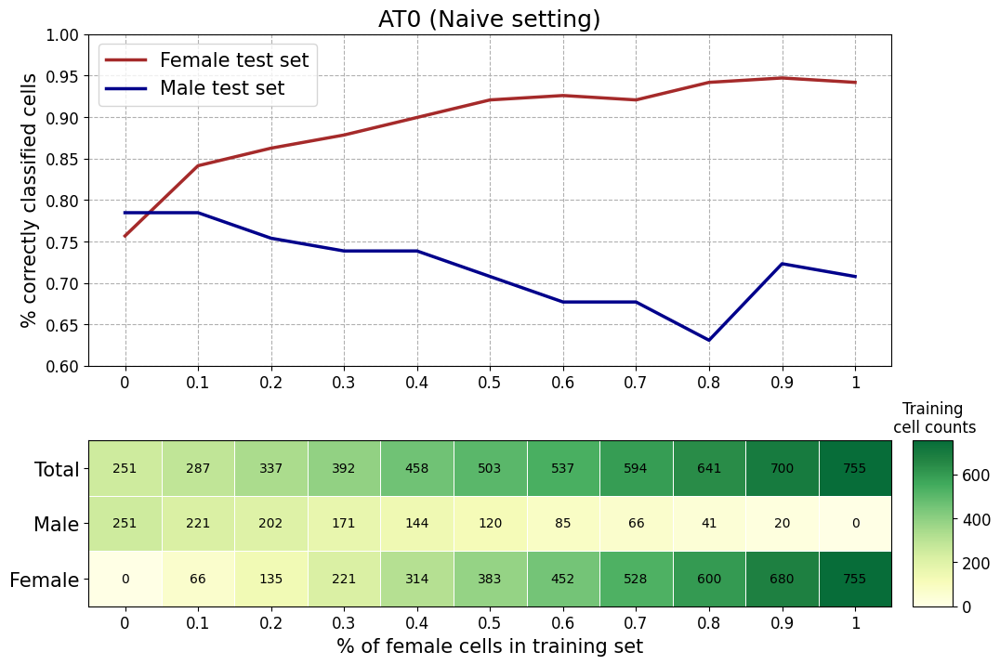

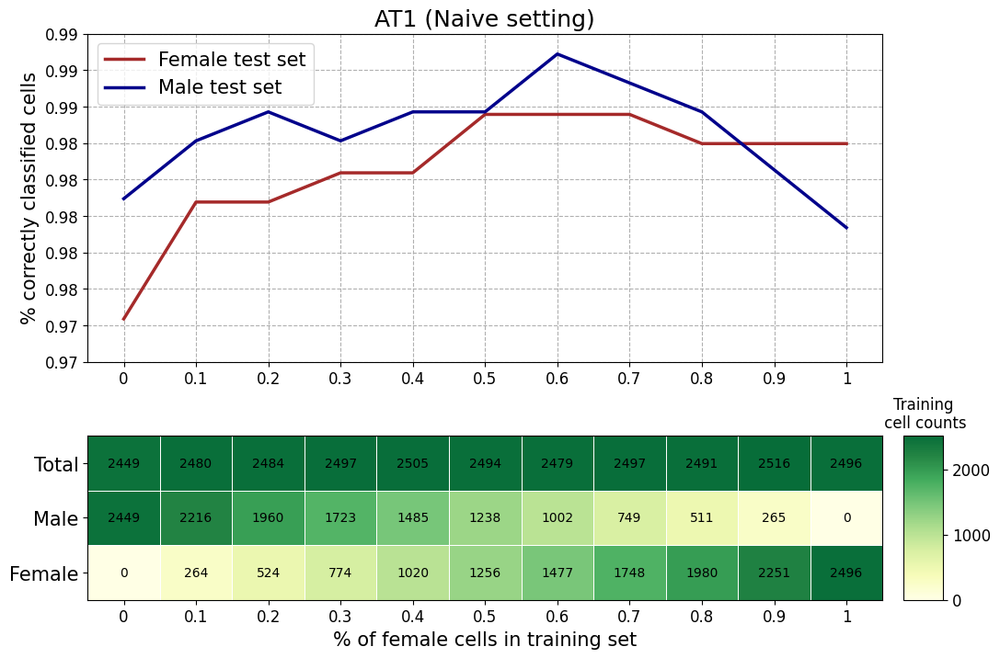

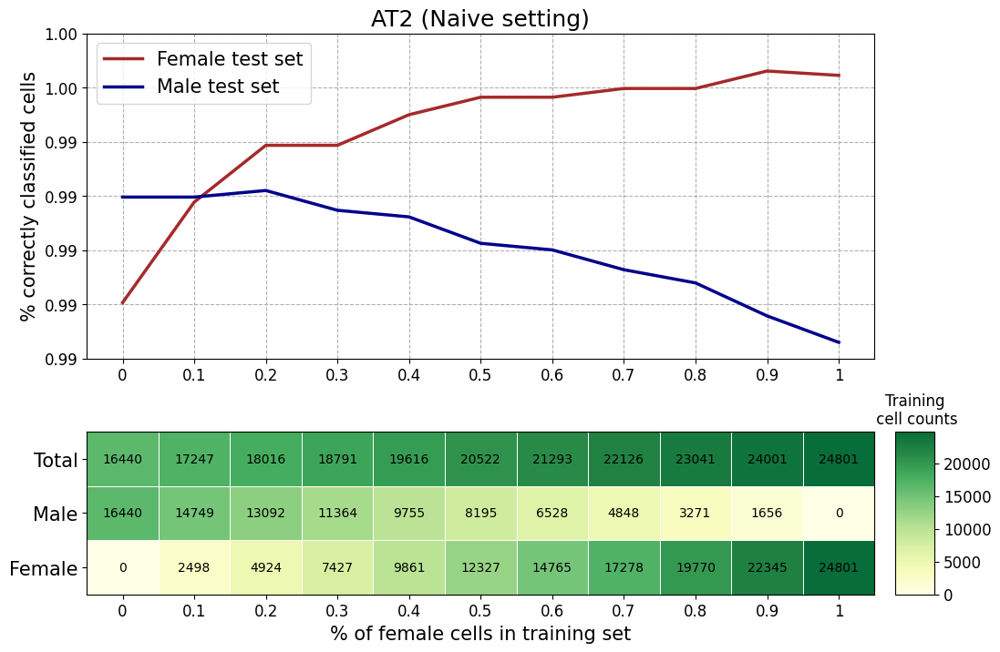

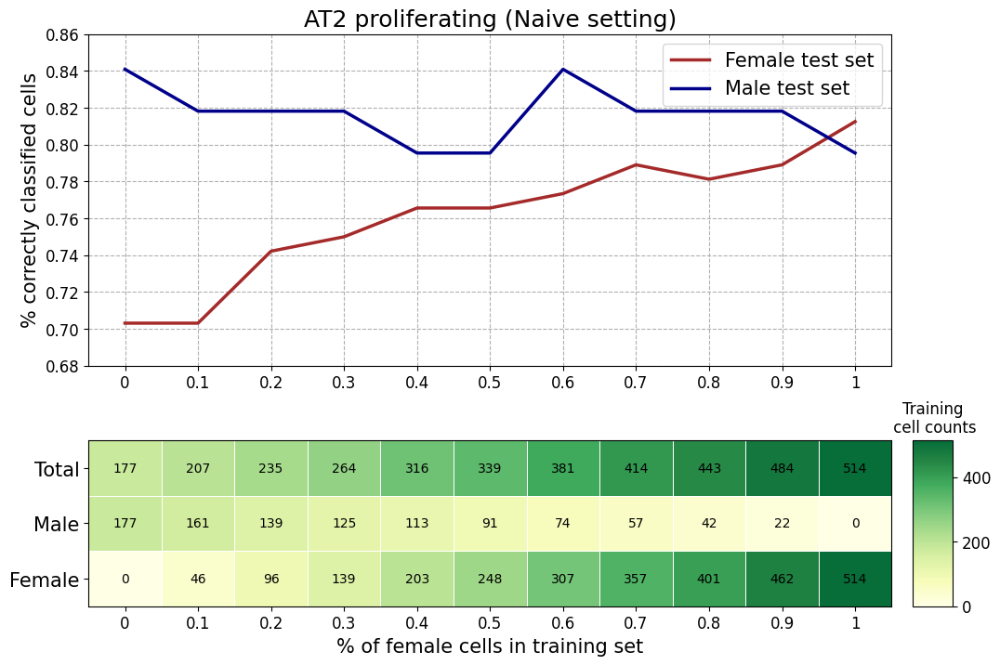

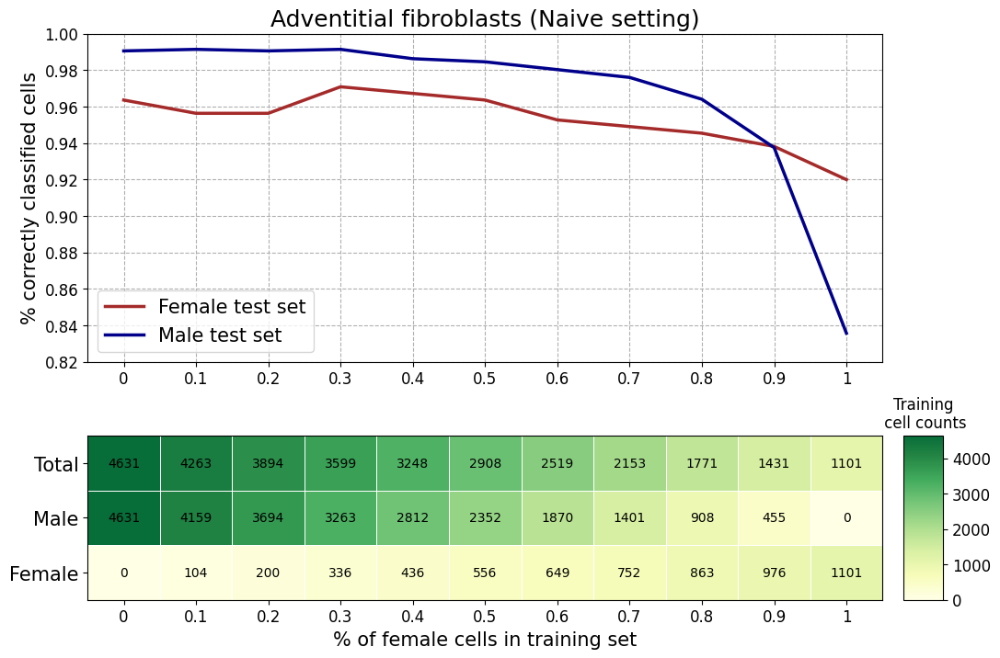

...

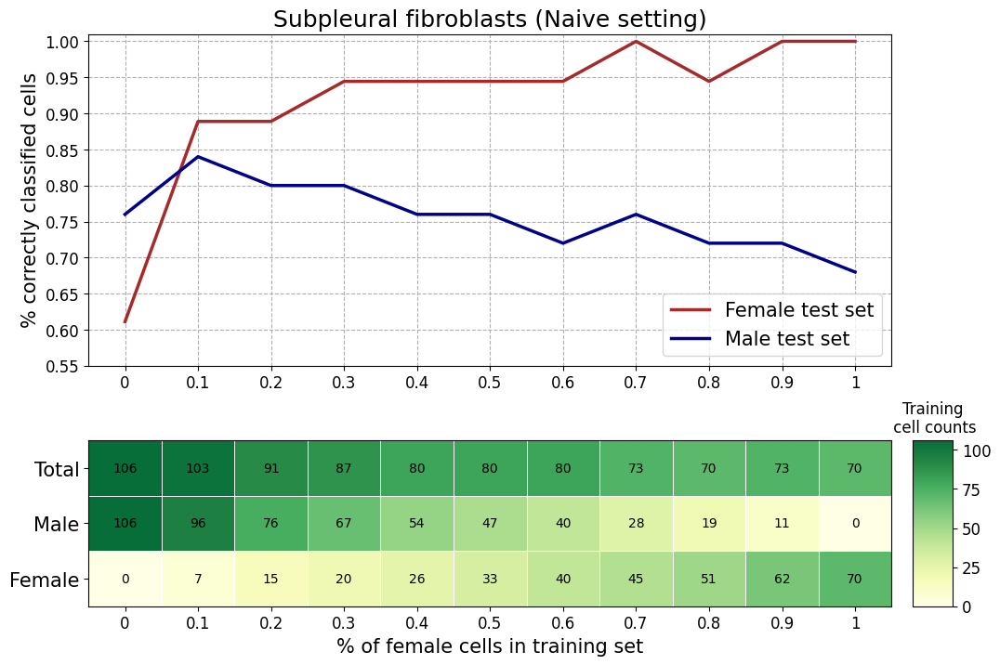

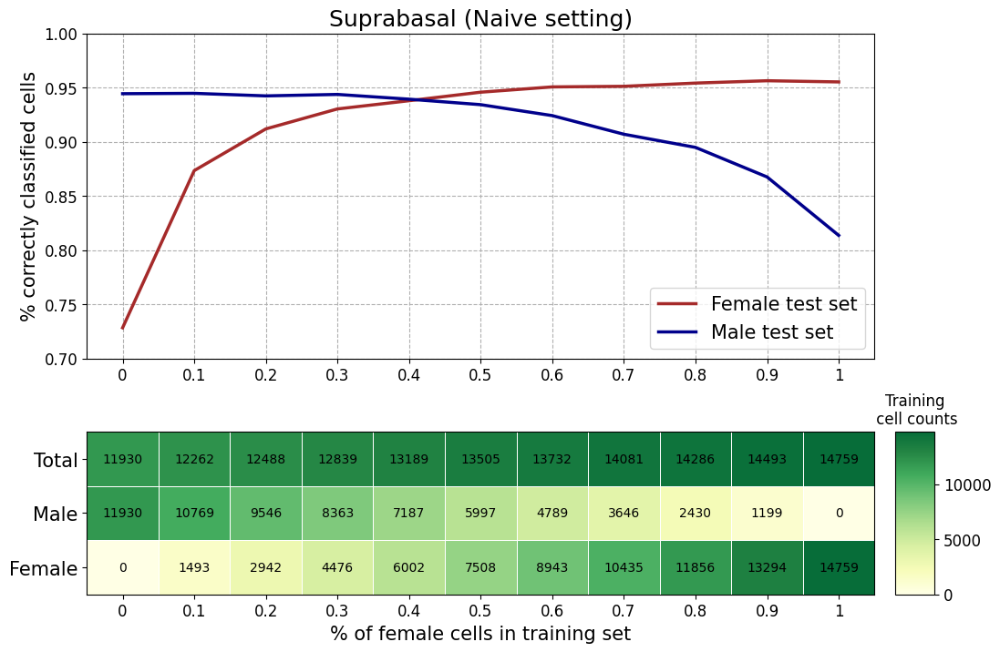

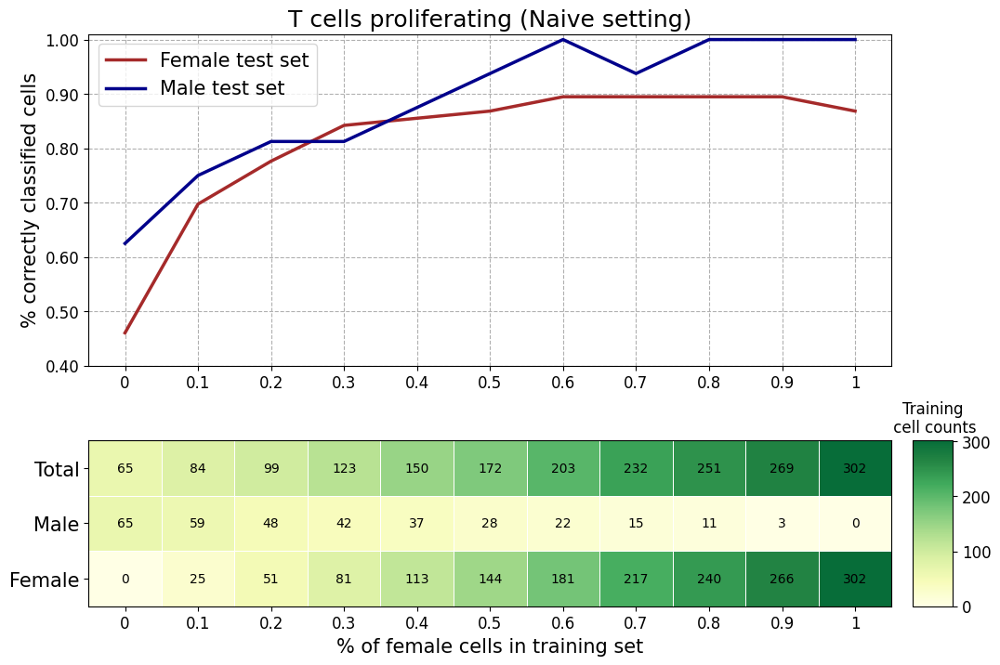

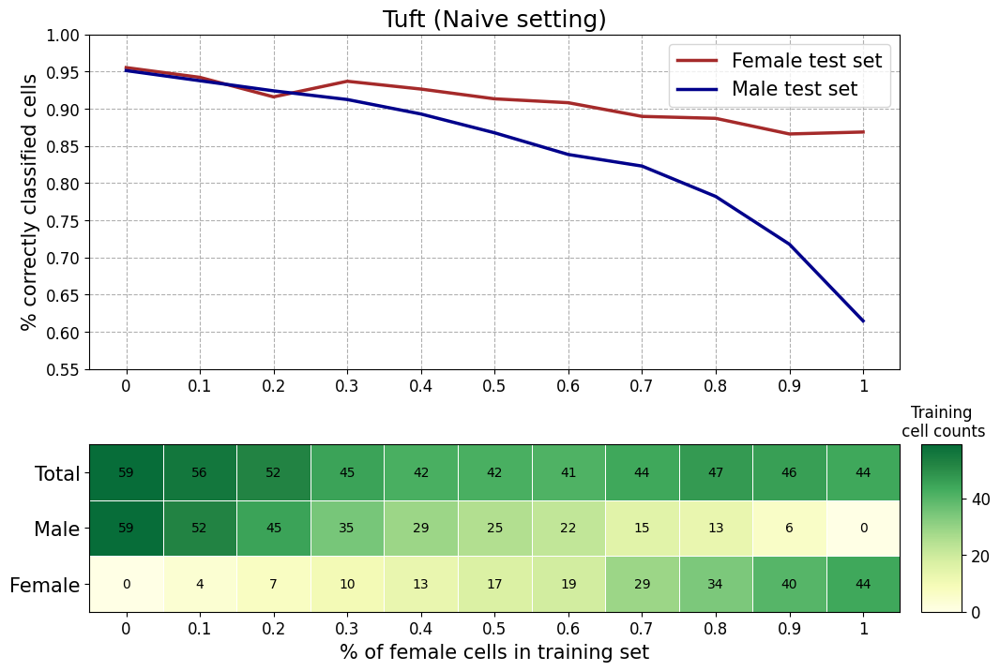

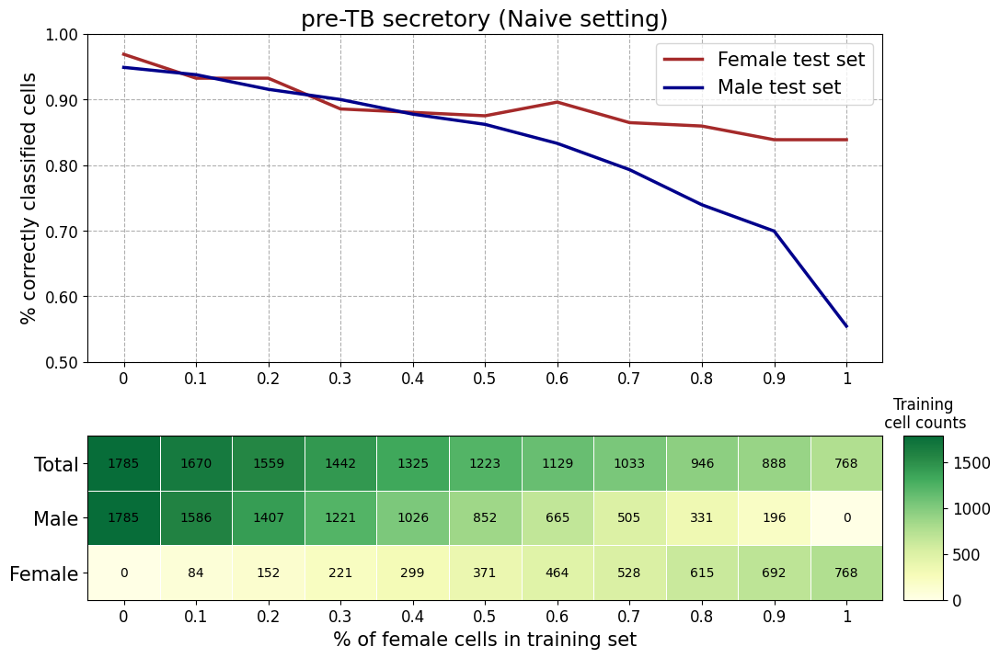

In [15]:
for cell_type in cell_names["ann_finest"]:
    ann_level = det_ann_level(cell_type, cell_names)
    male_lst, female_lst = gather_cms(general_path, 'seed42', classifier, ann_level, cell_names, cell_type)
    slopes, opposing_tuple, max_diff = plot_combined_classif(cell_type, cell_type, female_lst, male_lst, training_counts_dict[ann_level])

    temp_df = pd.DataFrame({
        'Cell type': [cell_type],
        'Slope test': [opposing_tuple[0]],
        'Flip test': [opposing_tuple[1]],
        'Maximum performance difference': [max_diff],
        'Slope on female set': slopes[0],
        'Slope on male set': slopes[1]
    })
    results_df = pd.concat([results_df, temp_df], ignore_index=True)

### Final table

In [16]:
results_df

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set
0,AT0,True,True,0.311030,0.154401,-0.107692
1,AT1,True,True,0.006593,0.007284,-0.000433
2,AT2,True,True,0.009850,0.006583,-0.005470
3,AT2 proliferating,True,True,0.137784,0.099432,-0.016529
4,Adventitial fibroblasts,False,True,0.084243,-0.034711,-0.100552
...,...,...,...,...,...,...
56,Subpleural fibroblasts,True,True,0.320000,0.242424,-0.112727
57,Suprabasal,True,True,0.215952,0.149741,-0.108491
58,T cells proliferating,False,False,0.164474,0.302632,0.346591
59,Tuft,False,False,0.253980,-0.085183,-0.292890


In [17]:
# consider 'distinct behavior' if both slope test and flip test are fulfilled:
results_df['Classification trend'] = results_df.apply(
    lambda row: 'Distinct' if row['Slope test'] and row['Flip test'] else 'Non-distinct',
    axis=1
)
results_df

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set,Classification trend
0,AT0,True,True,0.311030,0.154401,-0.107692,Distinct
1,AT1,True,True,0.006593,0.007284,-0.000433,Distinct
2,AT2,True,True,0.009850,0.006583,-0.005470,Distinct
3,AT2 proliferating,True,True,0.137784,0.099432,-0.016529,Distinct
4,Adventitial fibroblasts,False,True,0.084243,-0.034711,-0.100552,Non-distinct
...,...,...,...,...,...,...,...
56,Subpleural fibroblasts,True,True,0.320000,0.242424,-0.112727,Distinct
57,Suprabasal,True,True,0.215952,0.149741,-0.108491,Distinct
58,T cells proliferating,False,False,0.164474,0.302632,0.346591,Non-distinct
59,Tuft,False,False,0.253980,-0.085183,-0.292890,Non-distinct


#### Manually check inconclusive cell types:

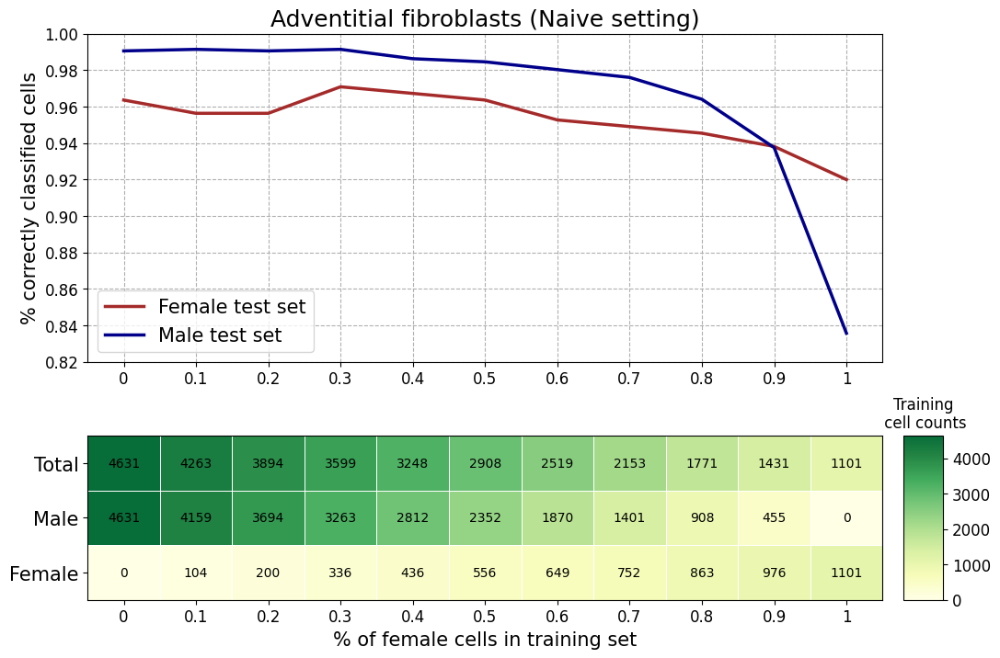

Adventitial fibroblasts: -0.0347107438016529, -0.10055214246831014


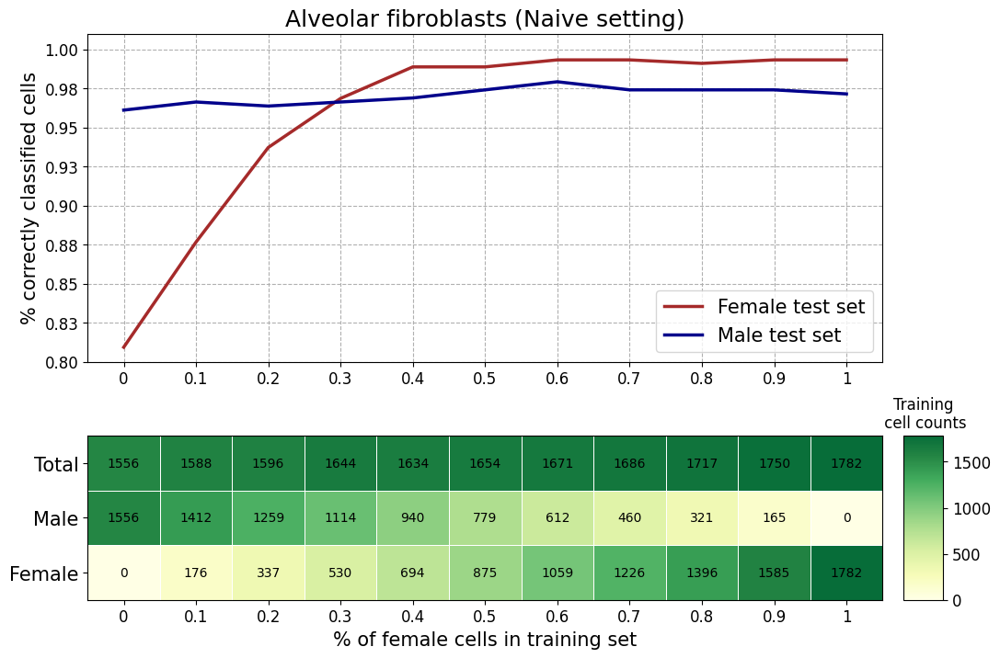

Alveolar fibroblasts: 0.14553607827150425, 0.012717852096090486


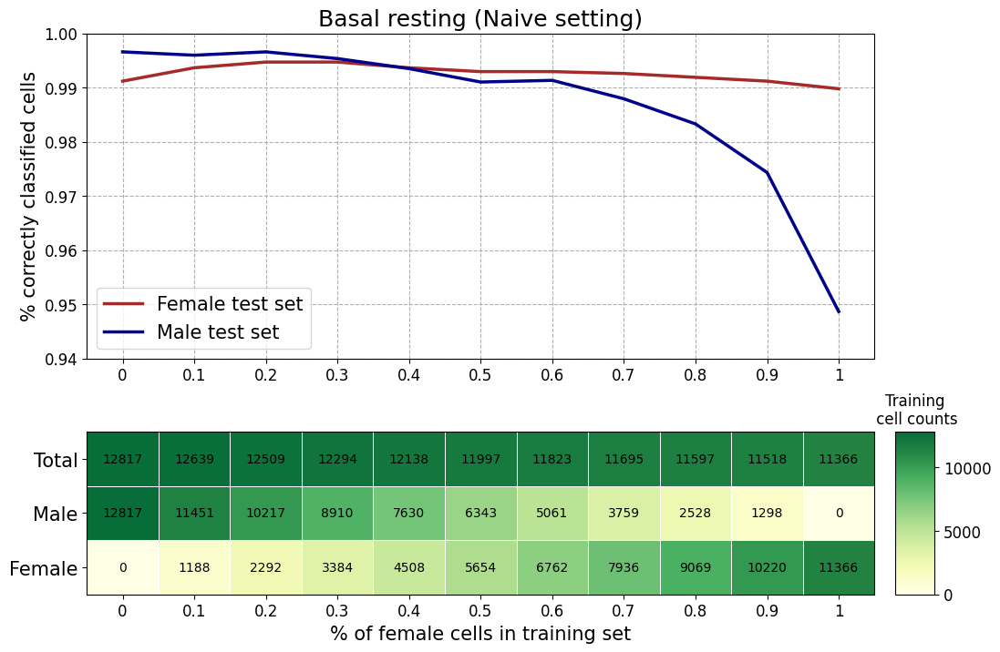

Basal resting: -0.0027519119388179545, -0.034818041309540554


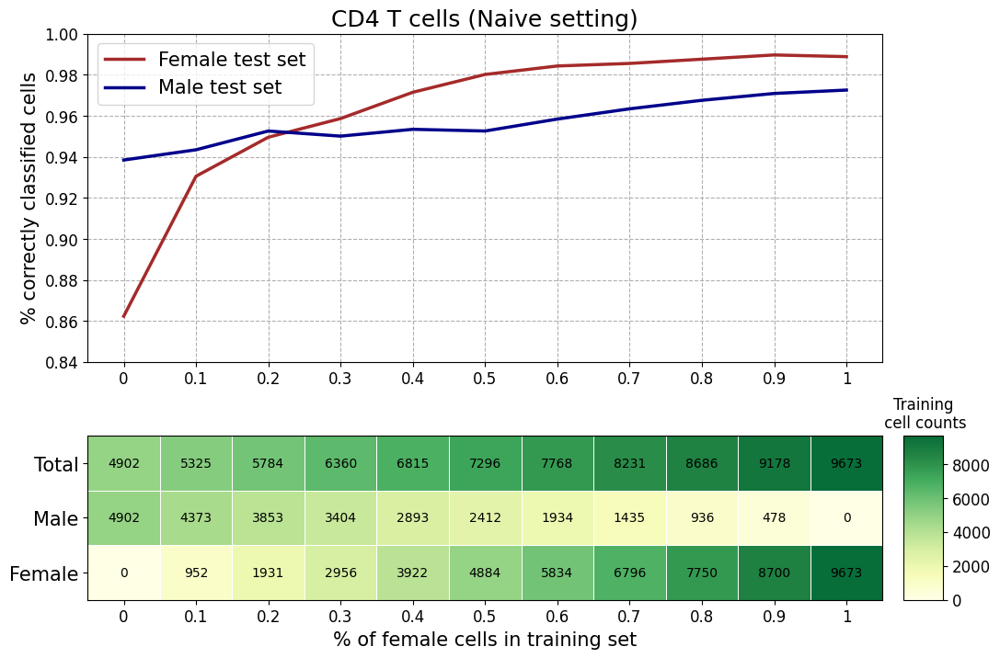

CD4 T cells: 0.09545830513572447, 0.03244592346089848


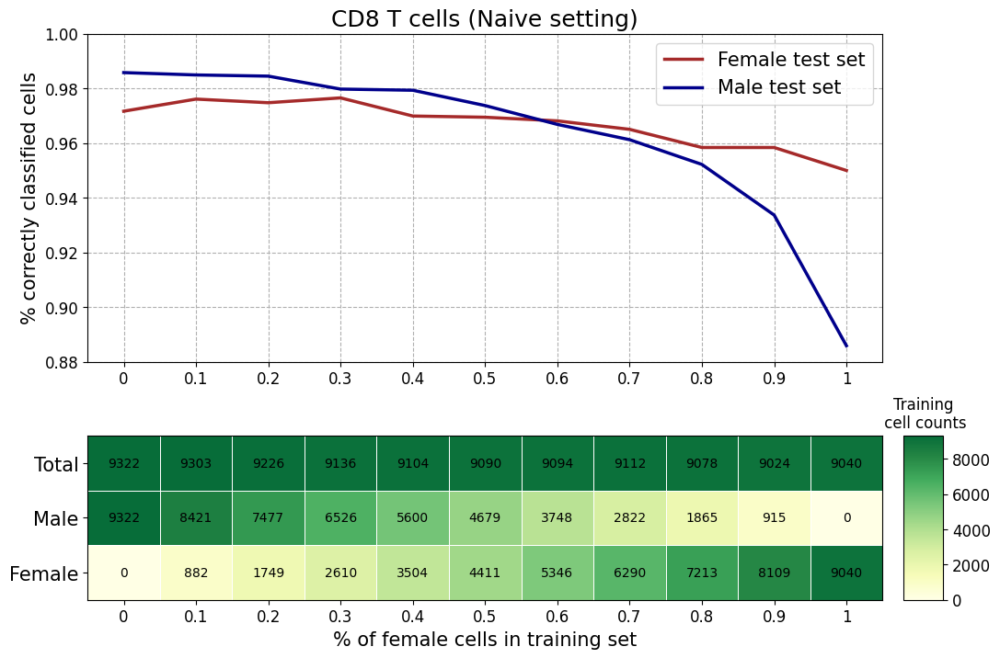

CD8 T cells: -0.023008849557522176, -0.07732947207764265


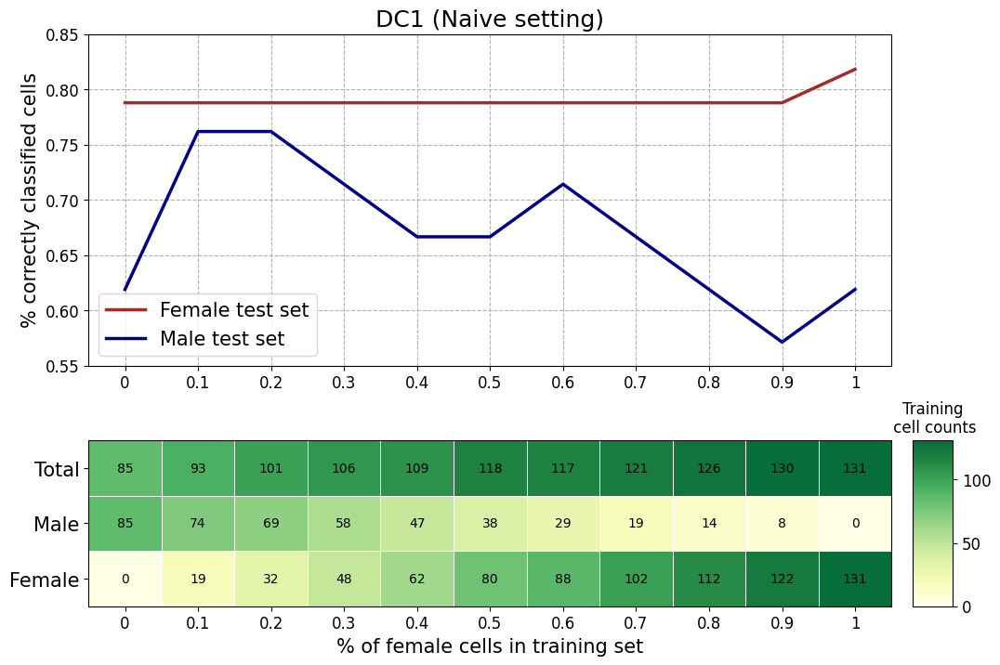

DC1: 0.013774104683195633, -0.11255411255411257


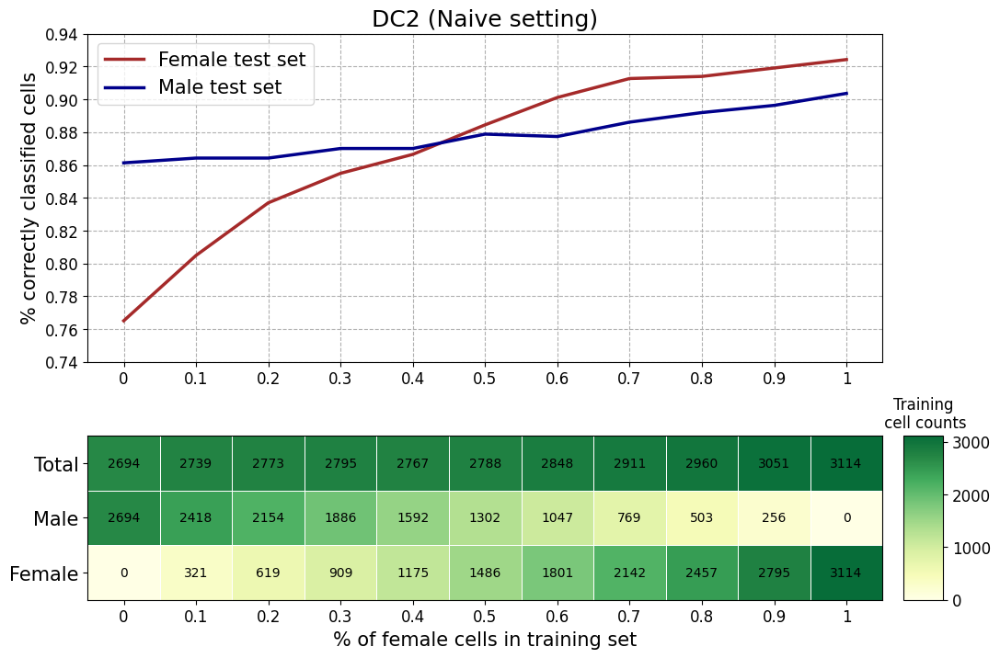

DC2: 0.14855875831485593, 0.04207033842070337


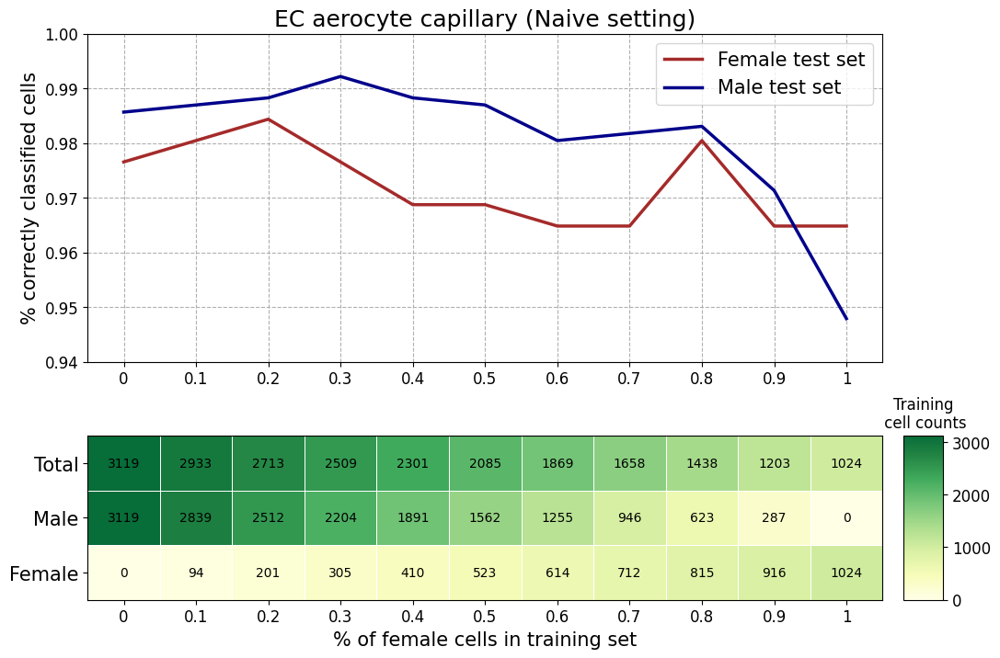

EC aerocyte capillary: -0.014559659090909095, -0.026870265151515197


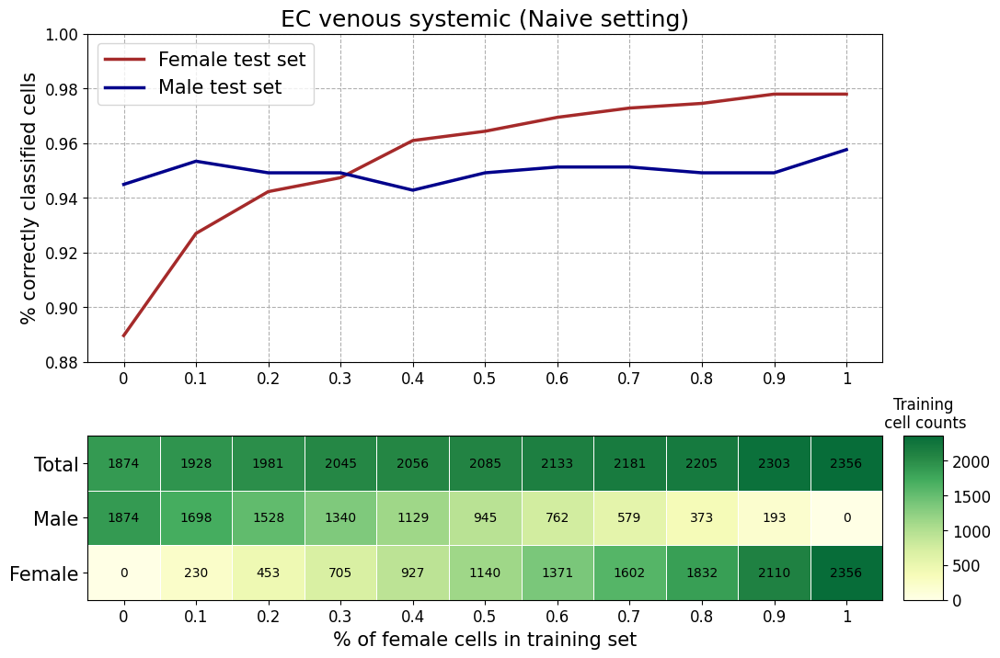

EC venous systemic: 0.0728507485723106, 0.005392912172573176


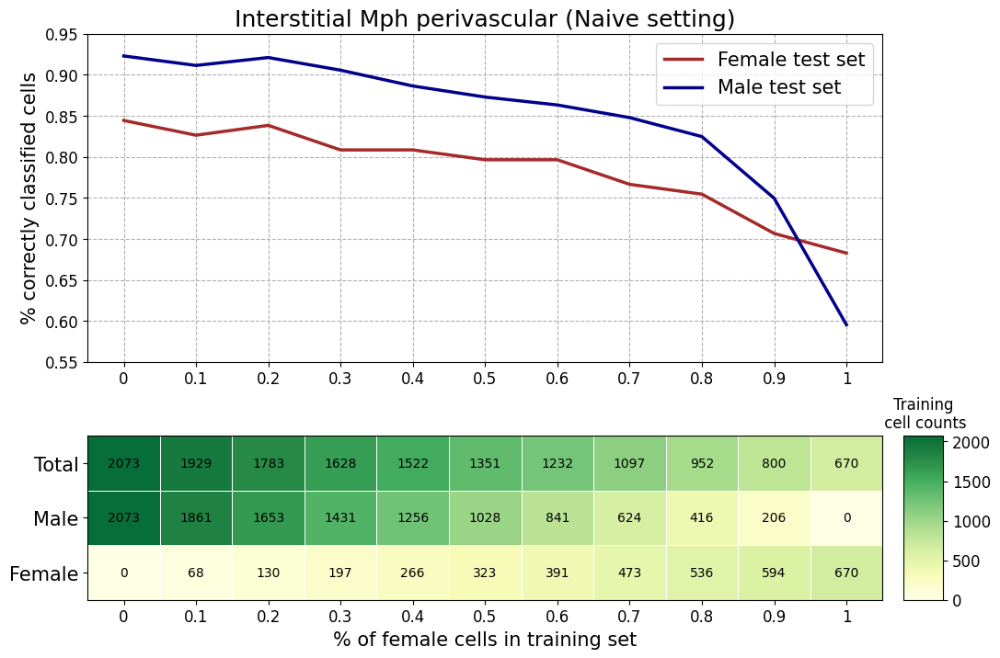

Interstitial Mph perivascular: -0.14861186717474142, -0.24662813102119466


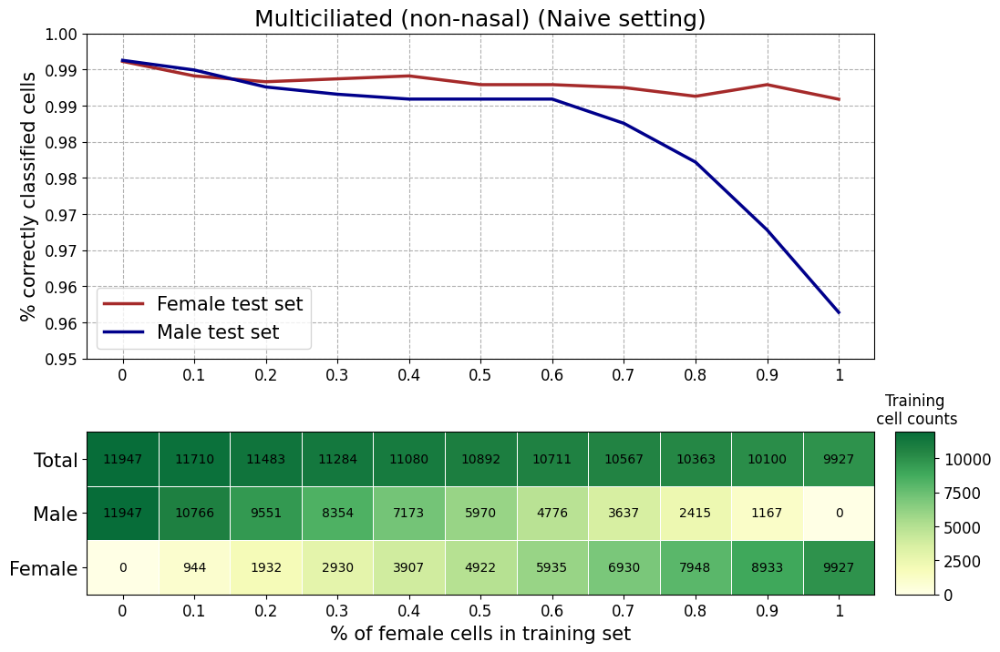

Multiciliated (non-nasal): -0.0036993626840524153, -0.027467837326992272


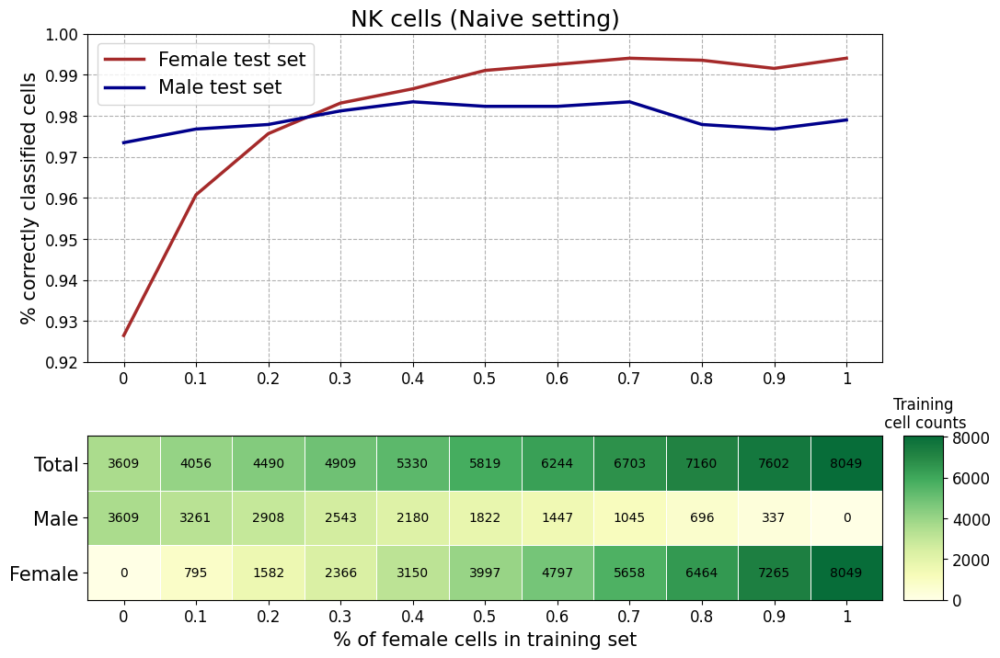

NK cells: 0.0493403217061269, 0.0028157683024939715


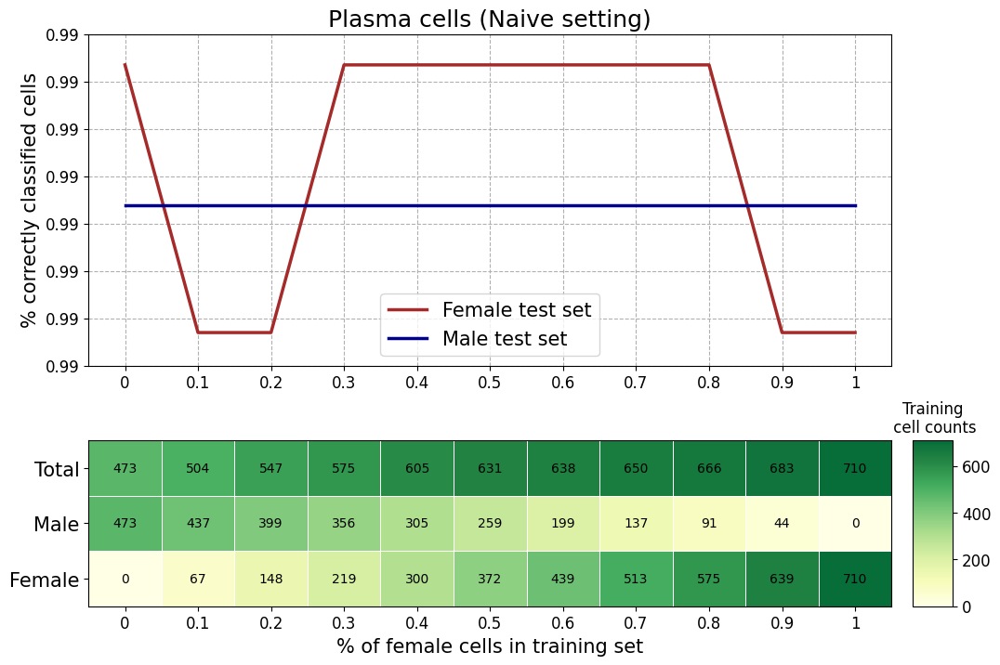

Plasma cells: -0.0010272213662044277, -6.849008143518759e-33


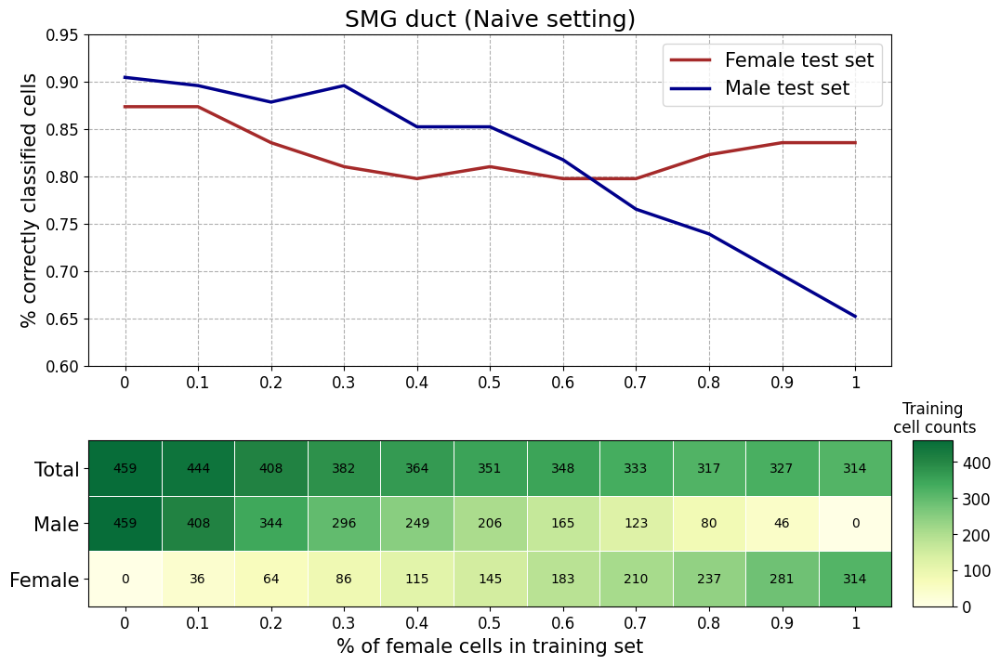

SMG duct: -0.03682393555811274, -0.25217391304347836


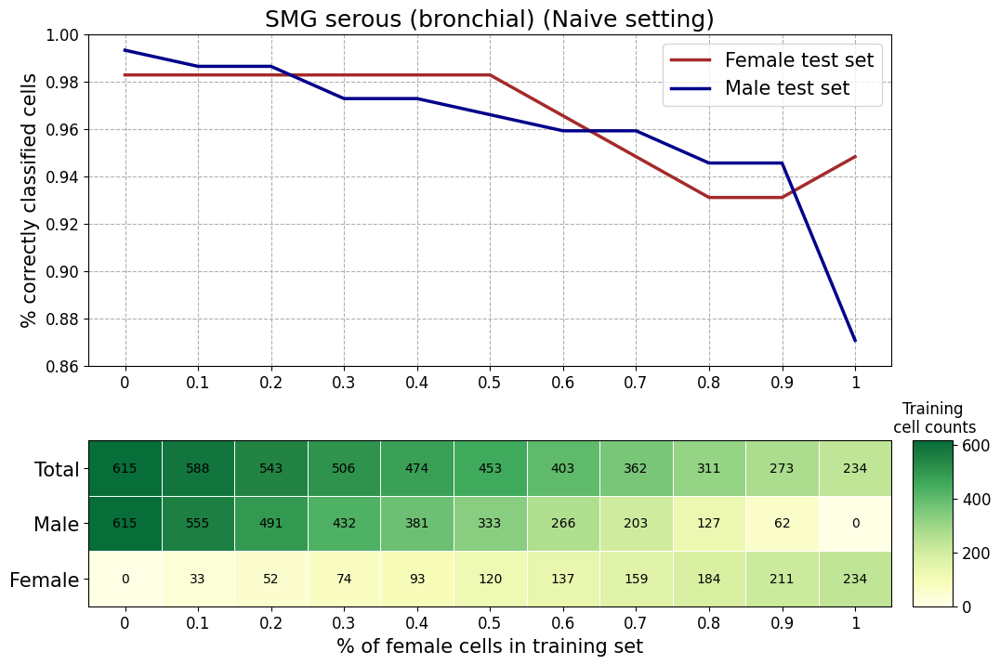

SMG serous (bronchial): -0.05642633228840123, -0.08534322820037106


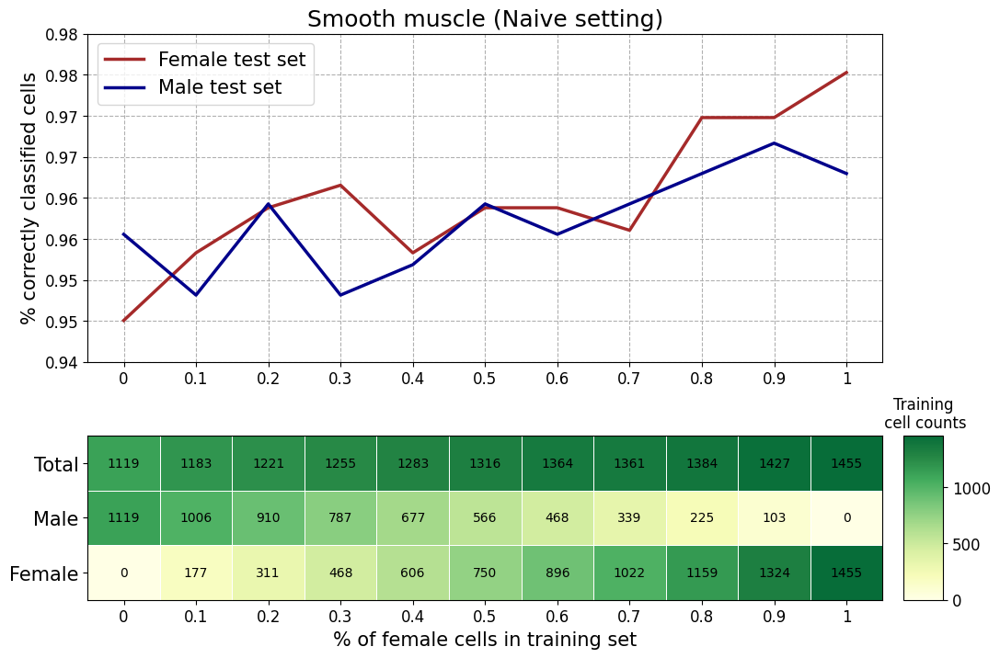

Smooth muscle: 0.022227772227772204, 0.013468013468013402


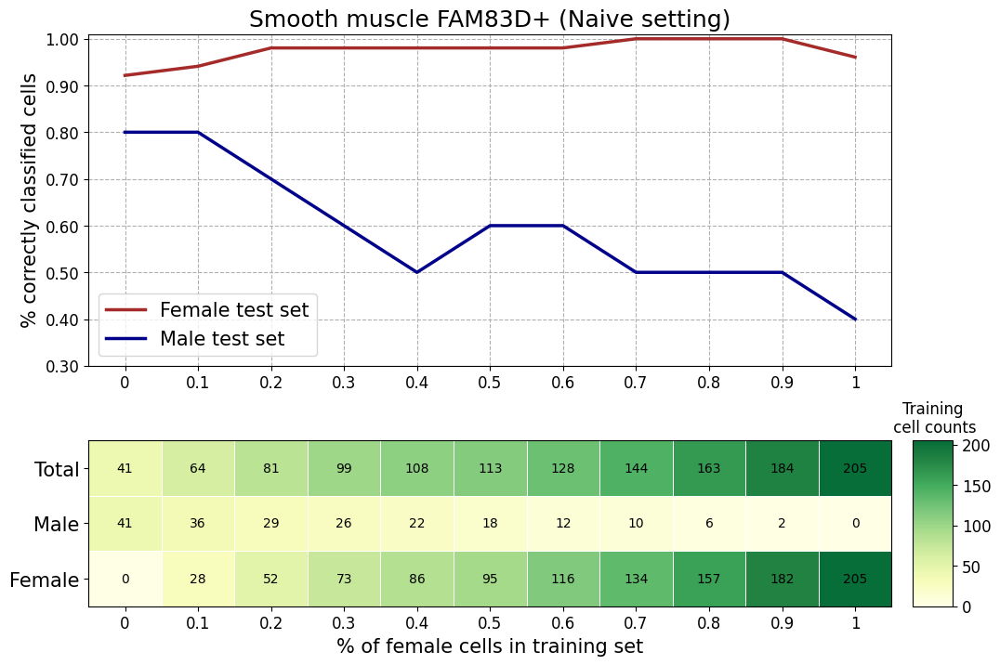

Smooth muscle FAM83D+: 0.04812834224598937, -0.35454545454545466


In [18]:
inconclusive = results_df[results_df['Slope test'] != results_df['Flip test']]
for cell_type in inconclusive['Cell type']:
    ann_level = det_ann_level(cell_type, cell_names)
    male_lst, female_lst = gather_cms(general_path, 'seed42', classifier, ann_level, cell_names, cell_type)
    (slope_female, slope_male), _, _ = opposing_tuple = plot_combined_classif(cell_type, cell_type, female_lst, male_lst, training_counts_dict[ann_level])
    print(f'{cell_type}: {slope_female}, {slope_male}')
    if np.abs(slope_female) < 0.01 or np.abs(slope_male) < 0.01:
        results_df.loc[results_df['Cell type'] == cell_type, 'Classification trend'] = 'Inconclusive'

In [19]:
results_df.head(61)

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set,Classification trend
0,AT0,True,True,0.311030,0.154401,-0.107692,Distinct
1,AT1,True,True,0.006593,0.007284,-0.000433,Distinct
2,AT2,True,True,0.009850,0.006583,-0.005470,Distinct
3,AT2 proliferating,True,True,0.137784,0.099432,-0.016529,Distinct
4,Adventitial fibroblasts,False,True,0.084243,-0.034711,-0.100552,Non-distinct
...,...,...,...,...,...,...,...
56,Subpleural fibroblasts,True,True,0.320000,0.242424,-0.112727,Distinct
57,Suprabasal,True,True,0.215952,0.149741,-0.108491,Distinct
58,T cells proliferating,False,False,0.164474,0.302632,0.346591,Non-distinct
59,Tuft,False,False,0.253980,-0.085183,-0.292890,Non-distinct


In [20]:
results_df["Maximum performance difference"].describe()

count    61.000000
mean      0.155423
std       0.160285
min       0.000000
25%       0.041985
50%       0.096230
75%       0.223347
max       0.615128
Name: Maximum performance difference, dtype: float64

In [21]:
# bottom quartile: 0.041985
mask = (results_df['Maximum performance difference'] <= 0.041985)
results_df.loc[mask, 'Classification trend'] = 'Inconclusive'
results_df

,Cell type,Slope test,Flip test,Maximum performance difference,Slope on female set,Slope on male set,Classification trend
0,AT0,True,True,0.311030,0.154401,-0.107692,Distinct
1,AT1,True,True,0.006593,0.007284,-0.000433,Inconclusive
2,AT2,True,True,0.009850,0.006583,-0.005470,Inconclusive
3,AT2 proliferating,True,True,0.137784,0.099432,-0.016529,Distinct
4,Adventitial fibroblasts,False,True,0.084243,-0.034711,-0.100552,Non-distinct
...,...,...,...,...,...,...,...
56,Subpleural fibroblasts,True,True,0.320000,0.242424,-0.112727,Distinct
57,Suprabasal,True,True,0.215952,0.149741,-0.108491,Distinct
58,T cells proliferating,False,False,0.164474,0.302632,0.346591,Non-distinct
59,Tuft,False,False,0.253980,-0.085183,-0.292890,Non-distinct


In [22]:
print(f'{len(results_df[results_df["Classification trend"] == "Distinct"])} cell types with distinct behavior.')
print(f'{len(results_df[results_df["Classification trend"] == "Non-distinct"])} cell types with non-distinct behavior.')
print(f'{len(results_df[results_df["Classification trend"] == "Inconclusive"])} cell types with inconclusive behavior.')

24 cell types with distinct behavior.
20 cell types with non-distinct behavior.
17 cell types with inconclusive behavior.


In [23]:
with open(f'{path_results}/df_classification_trend.pickle', 'wb') as file:
    pickle.dump(results_df, file)

Supplementary table:

In [24]:
# round for lisibility purposes
results_df.loc[:, 'Slope on male set'] = round(results_df.loc[:, 'Slope on male set'], 3)
results_df.loc[:, 'Slope on female set'] = round(results_df.loc[:, 'Slope on female set'], 3)
results_df.loc[:, 'Maximum performance difference'] = round(results_df.loc[:, 'Maximum performance difference'], 3)

results_df.loc[:,["Cell type", "Slope on male set", "Slope on female set", "Slope test", "Flip test", "Maximum performance difference", "Classification trend"]].head(61)

,Cell type,Slope on male set,Slope on female set,Slope test,Flip test,Maximum performance difference,Classification trend
0,AT0,-0.108,0.154,True,True,0.311,Distinct
1,AT1,-0.000,0.007,True,True,0.007,Inconclusive
2,AT2,-0.005,0.007,True,True,0.010,Inconclusive
3,AT2 proliferating,-0.017,0.099,True,True,0.138,Distinct
4,Adventitial fibroblasts,-0.101,-0.035,False,True,0.084,Non-distinct
...,...,...,...,...,...,...,...
56,Subpleural fibroblasts,-0.113,0.242,True,True,0.320,Distinct
57,Suprabasal,-0.108,0.150,True,True,0.216,Distinct
58,T cells proliferating,0.347,0.303,False,False,0.164,Non-distinct
59,Tuft,-0.293,-0.085,False,False,0.254,Non-distinct
